<a href="https://colab.research.google.com/github/BitKnitting/FitHome_Analysis/blob/master/notebooks/Entertainment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Entertainment
This notebook figures out how much electricity is leaked through the plug servicing a home's entertainment area.  

It is common for a home to have a place - typically a living room - where there might be a TV, DVD Player, game console, audio equipment, and other entertainment devices plugged in.  These devices are usually used for a short period during the day. However, they are left plugged in.

Entertainment devices love to leak electricity.

We inserted a TP-LINK smart plug between the wall socket and the power cord that provides power to the devices.


In [0]:
import pandas as pd

# Data Directly from Firebase
We use a curl command to grab the readings in Firebase.  We then get the readings into a suitable Pandas dataframe for analysis.

In [0]:
%%time
!curl 'https://fithome-9ebbd.firebaseio.com/flower-09282019/device_readings/Entertainment.json?print=pretty' > entertainment.json  
df_needs_reshape = pd.read_json("entertainment.json","r", encoding="utf8")
df_reshaped = df_needs_reshape.T
# The datetime is in UTC time.  We are in the US/Pacific timezone.
df_reshaped.index = df_reshaped.index.tz_localize('UTC').tz_convert('US/Pacific')
df_reshaped.head()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 5669k  100 5669k    0     0  2425k      0  0:00:02  0:00:02 --:--:-- 2424k


In [0]:
# @title Put into a Pandas dataframe
df_needs_reshape = pd.read_json("entertainment.json","r", encoding="utf8")
df_reshaped = df_needs_reshape.T
df_reshaped.head()

,I,P
2019-10-18 15:46:38,0.507347,36.793682
2019-10-18 15:46:39,0.507347,36.793682
2019-10-18 15:46:40,0.507347,36.793682
2019-10-18 15:46:41,0.507347,36.793682
2019-10-18 15:46:42,0.510346,36.918450


In [0]:
# The datetime is in UTC time.  We are in Kirkland, WA
df_reshaped.index = df_reshaped.index.tz_localize('UTC').tz_convert('US/Pacific')


In [0]:
# @title Start Date and End Data of Series
print('Start date: {}'.format(df_reshaped.index.min()))
print('End   date: {}'.format(df_reshaped.index.max()))
time_between = df_reshaped.index.max() - df_reshaped.index.min()
print('\n\nElapsed time: {}'.format(time_between))

Start date: 2019-10-18 08:46:38-07:00
End   date: 2019-10-19 10:36:17-07:00


Elapsed time: 1 days 01:49:39


# Save the Data
We will save the data locally so we can use it offline.  The columns will be the date, current reading, power reading.  We're not saving the header.

In [0]:

df_reshaped.to_csv('data/entertainment.csv',header=False)

# Read Local Data
If we're not connected to the net, we can still analyze a dataset.  When we load the local dataset, we want the date column to be our datetime index.

In [0]:
df_reshaped = pd.read_csv('data/entertainment.csv',names=['date','I','P'])
df_reshaped['datetime'] = pd.to_datetime(df_reshaped['date'])
df_reshaped = df_reshaped.set_index('datetime')
df_reshaped.drop(['date'],axis=1,inplace=True)
df_reshaped.head()

,I,P
datetime,,
2019-10-18 08:46:38-07:00,0.507347,36.793682
2019-10-18 08:46:39-07:00,0.507347,36.793682
2019-10-18 08:46:40-07:00,0.507347,36.793682
2019-10-18 08:46:41-07:00,0.507347,36.793682
2019-10-18 08:46:42-07:00,0.510346,36.918450


# Describe the Data
Let's look at some interesting stats

In [0]:
# @title Interesting Data Stats
df_reshaped.describe()

,I,P
count,90670.000000,90670.000000
mean,0.940050,89.128225
std,0.595754,79.929354
min,0.236490,15.870870
25%,0.596854,43.557367
50%,0.636823,47.268738
75%,0.965121,99.478036
max,2.872172,338.371207


In [0]:
import plotly.graph_objects as go

In [0]:
# @title Interactive Plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_reshaped.index,y=df_reshaped['P'],name='Power',line_color='deepskyblue'))
fig.update_layout(title_text='Power Readings',
                  xaxis_rangeslider_visible=True)
fig.show()

# Resample
The sample readings are not consistent.  Most are 4 seconds apart.  About 1/10th is 5 seconds apart.  Let's get all readings 5 seconds apart.

# Time Between Readings


In [0]:
df_reshaped.index.to_series().diff().tail(30)

In [0]:
# Trying a daily resample.
df_5s = df_reshaped.resample(rule='5S').mean()
df_5s.head(30)

,I,P
2019-10-02 13:35:50-07:00,4.321000,335.66490
2019-10-02 13:35:55-07:00,4.266000,334.75390
2019-10-02 13:36:00-07:00,4.253000,334.57370
2019-10-02 13:36:05-07:00,4.320000,333.43550
2019-10-02 13:36:10-07:00,3.901000,335.75755
2019-10-02 13:36:15-07:00,3.728000,335.72060
2019-10-02 13:36:20-07:00,3.725000,335.07710
2019-10-02 13:36:25-07:00,3.698000,332.65500
2019-10-02 13:36:30-07:00,3.717000,335.41935
2019-10-02 13:36:35-07:00,3.717000,337.11230


# kWh Per Hour
We have the samples in 5 second intervals.

Energy in kWh = sum(power)/1000 * T(5 seconds)/3600 (seconds/hour)

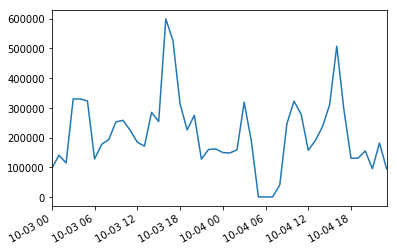

In [0]:
df_hourly = df_5s['2019-10-03':'2019-10-04'].resample(rule='h').sum()
df_hourly['P'].plot()

In [0]:
# @title Interactive Plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_hourly.index,y=df_hourly['P'],name='Power',line_color='deepskyblue'))
fig.update_layout(title_text='Power Readings',
                  xaxis_rangeslider_visible=True)
fig.show()

In [0]:
df_hourly.loc['2019-10-03 16:00:00']

I      5709.5855
P    599465.7676
Name: 2019-10-03 16:00:00-07:00, dtype: float64

In [0]:
df_hourly.loc['2019-10-03 16:00:00']/1000*5/3600

I    0.007930
P    0.832591
Name: 2019-10-03 16:00:00-07:00, dtype: float64

In [0]:
.83*24

19.919999999999998

In [0]:
df_hourly = df_5s['2019-10-03':'2019-10-04'].resample(rule='h').apply(energy)
df_new.index.to_series().diff().head(30)

TypeError: ignored

In [0]:
df_new['2019-10-02 13:36:00':'2019-10-03 13:35:59']['P'].sum()/3600/1000

1.3994410544999998

0.23822964913252315

In [0]:
# @title Add up an hours worth of data
#df_one = df_reshaped.between_time('2019-10-04','2019-10-05')
df_reshaped['2019-10-02 14:00:00':'2019-10-02 15:00:00'].tail()



,I,P
2019-10-02 14:59:42-07:00,3.432,278.4912
2019-10-02 14:59:46-07:00,3.461,280.5795
2019-10-02 14:59:50-07:00,3.445,279.1053
2019-10-02 14:59:54-07:00,3.435,278.2697
2019-10-02 14:59:58-07:00,3.446,279.3139


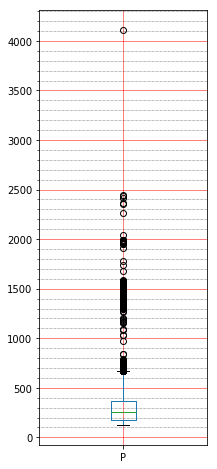

In [0]:
# @title Box Plot
ax = df_reshaped['P'].plot.box(figsize=(3,8))
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth='0.5', color='red')
ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black')

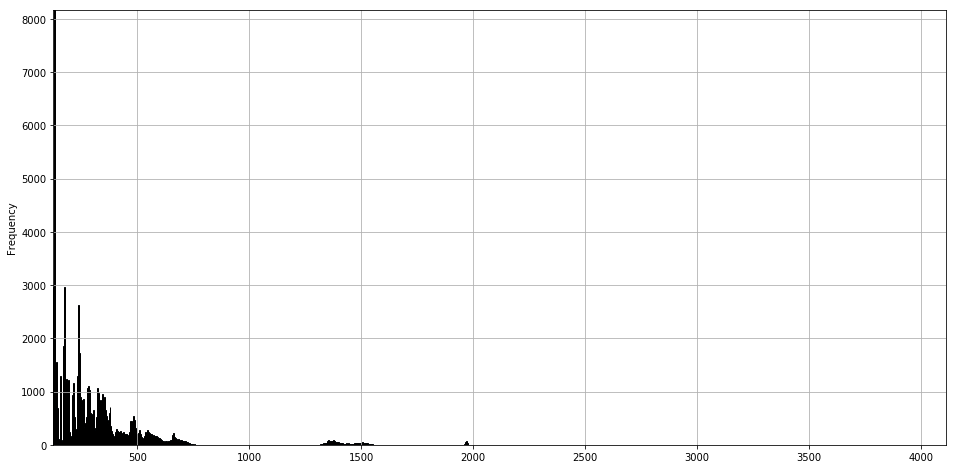

In [0]:
 # @title Histogram Distribution
 df_reshaped['P'].plot.hist(bins=1000, grid=True, edgecolor='k',figsize=(16,8)).autoscale(enable=True, axis='both', tight=True)


In [0]:
# @title Determine amount Leaking
df_bins = df_reshaped['P'].value_counts(bins=1000)
display(df_bins.head())
left_bin = df_bins.index[0].left
right_bin = df_bins.index[2].right

amount_leaking = (right_bin + left_bin) / 2
display(amount_leaking)

(128.609, 132.598]    8169
(120.631, 128.609]    2969
(172.483, 176.472]    2956
(236.299, 240.288]    2627
(168.495, 172.483]    1858
Name: P, dtype: int64

152.5405

In [0]:
# @title kWh
kwH = amount_leaking/1000*24*365
print('kwH in a year: {}'.format(kwH))
# .1036 / kWh in Kirkland
yearly_cost = kwH*.1036
print("yearly cost: ${}".format(yearly_cost))

kwH in a year: 1336.25478
yearly cost: $138.435995208




# Amount of Leaking Data
We estimate the amount of leaking electricity based on this dataset to be 152.5W

__TBD: How much is this as a percentage of total day?__